# This notebook

This particular notebook will explore using hourly resampled data.

# Import utils and helper functions

In [1]:
%run utils.ipynb

2.4.1


# Get the stocks data

In [2]:
df = get_stocks_df()

Connecting to the PostgreSQL database...
Connection successful


In [3]:
df.head()

,close,volume
dt,,
2015-10-08 13:40:00+00:00,242.50,0.050000
2015-10-08 13:41:00+00:00,242.95,0.001000
2015-10-08 13:42:00+00:00,242.95,NaN
2015-10-08 13:43:00+00:00,242.96,0.010000
2015-10-08 13:44:00+00:00,242.96,0.033491


## Resample to hourly and impute any missing values

In [5]:
# Close price is last
hourly_df = df.resample('H').last()

In [6]:
hourly_df['close'].isnull().sum()

1676

In [7]:
hourly_df['close'] = hourly_df['close'].fillna(method='ffill')

In [8]:
hourly_df['close'].isnull().sum()

0

# Attempt 1

This attempt uses 20 neurons, a window size of 5 (meaning the previous 5 values are used to make the prediction of the next value),
and an output size of 1 (meaning just 1 price point ahead is forecast). It uses hourly data, and we train over just a couple of months

In [9]:
## Config dict that defines this attempt
config = {
    "neurons": 512,                 # number of hidden units in the LSTM layer
    "activation_function": 'tanh',   # activation function for LSTM and Dense layer
    "loss": 'mse',                   # loss function for calculating the gradient, in this case Mean Squared Error. Could be mae
    "optimizer": 'adam',              # optimizer for appljying gradient decent
    "dropout": 0.25,                 # dropout ratio used after each LSTM layer to avoid overfitting
    "batch_size": 128,              
    "epochs": 20,                  
    "window_len": 5,                 # is an int to be used as the look back window for creating a single input sample.
    "training_size": 0.8,            # porportion of data to be used for training
    "shuffle_buffer": 1000,          # When shuffling the windowed Dataset how many at once to load into memory
    "output_size": 1,
    "start_date": '2021-01-01',
    "end_date": '2021-02-19',
}

In [18]:
# Clean up the memory
tf.keras.backend.clear_session()
model = build_model(config['output_size'], config['neurons'], config['activation_function'],
                    config['dropout'], config['loss'], config['optimizer'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, None, 25)          150       
_________________________________________________________________
lstm (LSTM)                  (None, None, 512)         1101824   
_________________________________________________________________
dropout (Dropout)            (None, None, 512)         0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 512)               2099200   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 1)                 513       
Total params: 3,201,687
Trainable params: 3,201,687
Non-trainable params: 0
______________________________________________

In [19]:
scaler, model_training_data, training_data, test_data, training_dates, test_dates = preprocessing(hourly_df, scaler='minmax', **config)

MinMax scaler


In [20]:
history = model.fit(model_training_data, epochs=config['epochs'], batch_size=config['batch_size'], verbose=1)

Epoch 1/20
8/8 [==============================] - 5s 219ms/step - loss: 0.0814 - mae: 0.2299
Epoch 2/20
8/8 [==============================] - 2s 218ms/step - loss: 0.0110 - mae: 0.0798
Epoch 3/20
8/8 [==============================] - 2s 218ms/step - loss: 0.0062 - mae: 0.0630
Epoch 4/20
8/8 [==============================] - 2s 222ms/step - loss: 0.0033 - mae: 0.0428
Epoch 5/20
8/8 [==============================] - 2s 221ms/step - loss: 0.0031 - mae: 0.0426
Epoch 6/20
8/8 [==============================] - 2s 215ms/step - loss: 0.0032 - mae: 0.0422
Epoch 7/20
8/8 [==============================] - 2s 216ms/step - loss: 0.0028 - mae: 0.0389
Epoch 8/20
8/8 [==============================] - 2s 220ms/step - loss: 0.0028 - mae: 0.0378
Epoch 9/20
8/8 [==============================] - 2s 217ms/step - loss: 0.0027 - mae: 0.0386
Epoch 10/20
8/8 [==============================] - 2s 222ms/step - loss: 0.0026 - mae: 0.0372
Epoch 11/20
8/8 [==============================] - 2s 220ms/step - lo

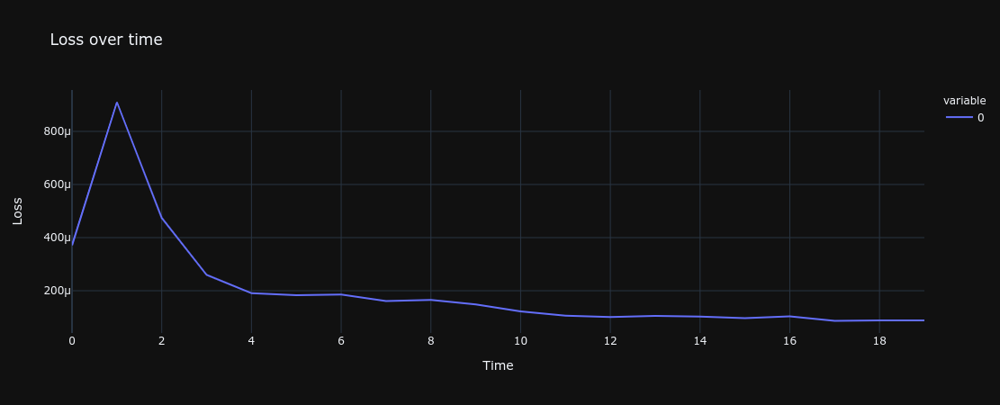

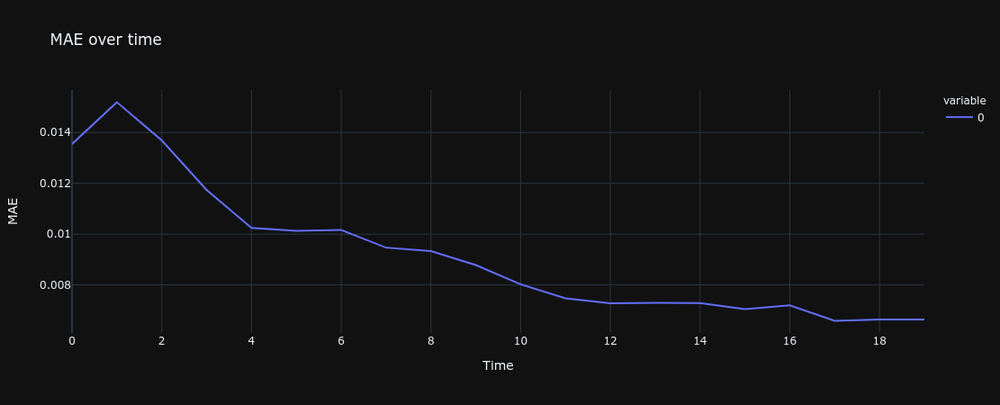

In [13]:
display_history(history)

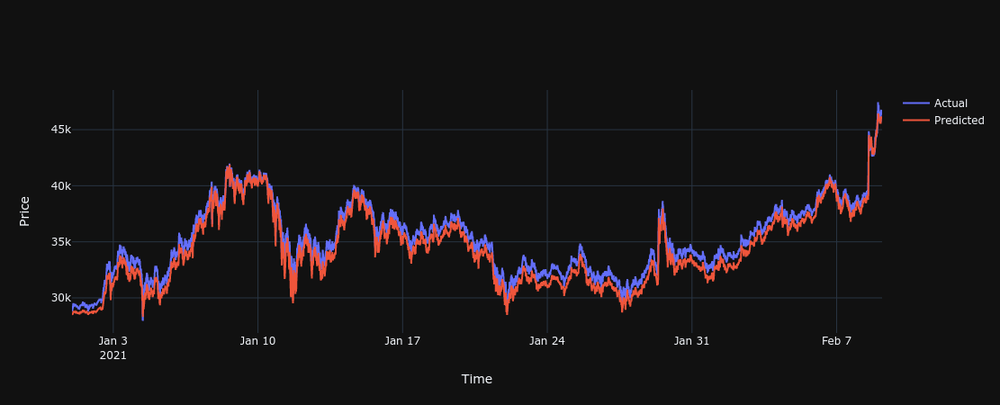

The MAE is 0.040141790853649426


In [14]:
train_res_df = display_results(model, scaler, training_data, training_dates, config['window_len'], config['output_size'])

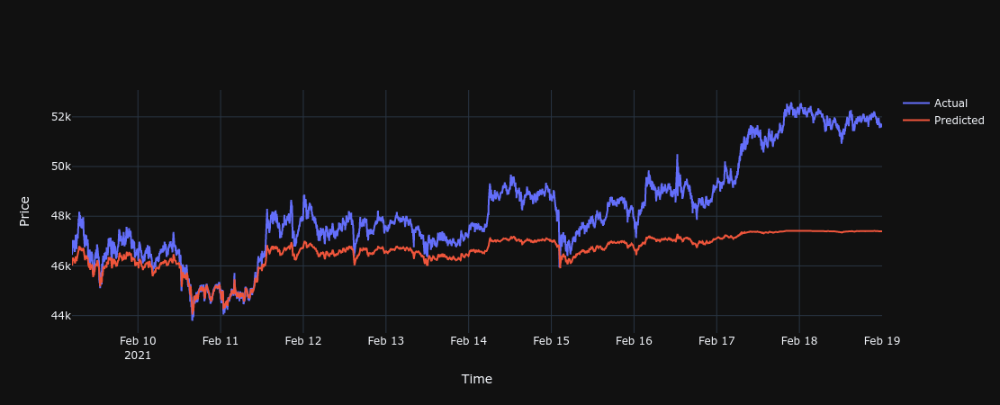

The MAE is 0.08384451184022604


In [16]:
test_res_df = display_results(model, scaler, test_data, test_dates, config['window_len'], config['output_size'])

## Summary

It seems that despite a great fit on the test set, as soon as we start predicting more than a couple of days in the future on the test set then the actual and predicted prices begin to diverge